## Imports

In [1]:
import numpy as np
import random
import collections 
import matplotlib.pyplot as plt
import gym

# Seed for reproducibility
env = gym.make("CartPole-v1")
seed_val = 455
np.random.seed(seed_val)
env.seed(seed_val)
random.seed(seed_val)

In [2]:
from keras.models import Sequential      # One layer after the other
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from keras import backend as k

Using TensorFlow backend.


## Game Properties

In [3]:
states = env.observation_space.shape
print('Number of states/variables in the mario environment', states)

Number of states/variables in the mario environment (4,)


In [4]:
actions = env.action_space.n
print('Number of responses/classes in the mario environment', actions)

Number of responses/classes in the mario environment 2


## Hyperparameters

In [5]:
# Discount in Bellman Equation
# Discounted future reward. How much we care about steps further in time
gamma = 0.95
# Epsilon
# Probability of doing a random move
epsilon = 1.0
# Minimum Epsilon
epsilon_min = 0.01
# Decay multiplier for epsilon
epsilon_decay = 0.95
# Size of deque container
deque_len = 20000
# Average score needed over 100 epochs
target_score = 350
# Number of games
episodes = 500
# Data points per episode used to train the agent
batch_size = 64
learning_rate = 0.001
hidden_neurons = 32
# Optimizer for training the agent
optimizer = 'adam'
# Loss for training the agent
loss = 'mse'
model_name='cartpole_agent_advanced'

## Agent - Model

The final layer is a Dense layer with two neurons equal to the number of possible actions:

In [6]:
def agent(states, actions):
    """Simple Deep Neural Network."""
    model = Sequential()
    model.add(Dense(hidden_neurons, input_shape=states, activation="relu"))
    model.add(Dense(hidden_neurons, activation="relu"))
    model.add(Dense(actions))
    model.add(Dense(actions, activation="linear"))
    model.add(Activation('linear'))
    return model

# print summary of the agent
print(agent(states, actions).summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 32)                160       
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 66        
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 6         
_________________________________________________________________
activation_1 (Activation)    (None, 2)                 0         
Total params: 1,288
Trainable params: 1,288
Non-trainable params: 0
_________________________________________________________________
None


In [7]:
def agent_action(model, epsilon, state, actions):
    """Define action to be taken."""
    if np.random.rand() <= epsilon:
        action = random.randrange(actions)
    else:
        action = np.argmax(model.predict(state))
    return action

### Save results to the memory

In [8]:
# Using deque for faster append & pop operations
training_data = collections.deque(maxlen=deque_len)

def add_to_memory(state, new_state, reward, done, action):
    """Function to store data points in the deque container."""
    training_data.append((state, new_state, reward, done, action))

In [9]:
def replay(model_name, epsilon, gamma, epsilon_min, epsilon_decay
           , model, training_data, batch_size=64):
    """Train the agent on a batch of data."""
    idx = random.sample(range(len(training_data)), min(len(training_data),batch_size))
    train_batch = [training_data[j] for j in idx]
    for state, new_state, reward, done, action in train_batch:
        q_update = reward
        if not done:
            # Q function - Bellman equation
            # reward - recieved for entering current state
            # gamma - discount
            # discounted maximum future reward for the next state
            q_update = reward + gamma * np.amax(model.predict(new_state)[0])

        q_values = model.predict(state)
        q_values[0][action] = q_update
    
        self_checkpoint = ModelCheckpoint(filepath=f'{model_name}.hdf5',monitor='loss',
            verbose=0, save_best_only=True)
        model.fit(state, q_values, epochs=1,callbacks=[self_checkpoint], verbose=0)

    if epsilon > epsilon_min:
        epsilon *= epsilon_decay
    return epsilon

In [10]:
def moving_average(data, n=100) :
    dataset = [0 for i in range(n)] + scores
    ret = np.cumsum(dataset, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return (ret[n - 1:] / n)

In [15]:
def performance_plot(scores, target_score, show=True):
    """Plot the game progress."""
    plt.figure(figsize=(16, 6))
    # Scores
    scores_arr = np.array(scores)
    plt.plot(scores_arr, label="Score per run")
    plt.plot(moving_average(scores,100), label="Moving Average over 100 episodes")
    # Target
    horiz_line_data = np.array([target_score for i in range(len(scores))])
    plt.plot(horiz_line_data, 'r--') 
    # Labels
    plt.title('Plot of Score v/s Episode') # title
    plt.xlabel('Episodes') # xlabel
    plt.ylabel('Scores') # ylabel
    plt.legend(loc="upper left")
    plt.savefig(f'{model_name}.png',
                    bbox_inches='tight', dpi=150)
    if show:
        plt.show()

In [12]:
scores = []
mean_scores = []
def train(model_name,target_score, batch_size, episodes, optimizer, loss, epsilon, gamma, epsilon_min, epsilon_decay, actions, render=False):
    k.clear_session()
    # define empty list to store the score at the end of each episode
    
    
    # load the agent
    model = agent(states, actions)
    
    # compile the agent with mean squared error loss
    model.compile(loss=loss, optimizer=Adam(lr=learning_rate))
    
    for episode in range(1, (episodes+1)):
        
        # reset environment at the end of each episode
        state = env.reset()
        
        state = np.expand_dims(state, axis=0)
        
        # set done value to False
        done = False
        
        # counter to keep track of actions taken in each episode
        time_step = 0
        
        # play the game
        while not done:
            if render:
                env.render()

            # call the agent_action function to decide on an action
            action = agent_action(model, epsilon, state, actions)
            
            # take the action
            new_state, reward, done, info = env.step(action)
            new_state = np.expand_dims(new_state, axis=0)
            reward = reward if not done else -10
            
            # call memory function to store info in the deque container
            add_to_memory(state, new_state, reward, done, action)
            
            # set state to new state
            state = new_state
            
            # increment timestep
            time_step += 1
            
        epsilon = replay(model_name,epsilon, gamma, epsilon_min, epsilon_decay, model,
                         training_data)
        scores.append(time_step)
        mean_scores.append(sum(scores[-100:])/100)
        
        print('episode {}, score {}, epsilon {:.4}'.format(episode,time_step,epsilon))
        performance_plot(scores, target_score, show=False)
        if sum(scores[-100:])/100 > target_score:
            print('------ Goal Achieved After {} Episodes ------'
                  .format(episode))
            # plot the scores over time
            performance_plot(scores, target_score)
            break
    env.close()
    return model

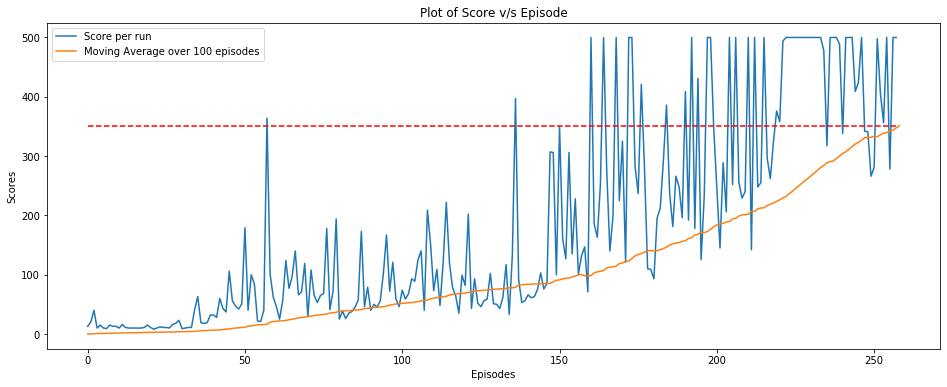

In [16]:
performance_plot(scores, target_score)

episode 1, score 13, epsilon 0.95
episode 2, score 20, epsilon 0.9025
episode 3, score 40, epsilon 0.8574
episode 4, score 10, epsilon 0.8145
episode 5, score 15, epsilon 0.7738
episode 6, score 10, epsilon 0.7351
episode 7, score 9, epsilon 0.6983
episode 8, score 15, epsilon 0.6634
episode 9, score 13, epsilon 0.6302
episode 10, score 13, epsilon 0.5987
episode 11, score 10, epsilon 0.5688
episode 12, score 16, epsilon 0.5404
episode 13, score 11, epsilon 0.5133
episode 14, score 10, epsilon 0.4877
episode 15, score 10, epsilon 0.4633
episode 16, score 10, epsilon 0.4401
episode 17, score 10, epsilon 0.4181
episode 18, score 10, epsilon 0.3972
episode 19, score 11, epsilon 0.3774
episode 20, score 15, epsilon 0.3585
episode 21, score 11, epsilon 0.3406


/home/nightingale/.local/share/virtualenvs/ai-plays-atari-a0NQD2v1/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


episode 22, score 8, epsilon 0.3235
episode 23, score 10, epsilon 0.3074
episode 24, score 12, epsilon 0.292
episode 25, score 11, epsilon 0.2774
episode 26, score 11, epsilon 0.2635
episode 27, score 10, epsilon 0.2503
episode 28, score 16, epsilon 0.2378
episode 29, score 18, epsilon 0.2259
episode 30, score 23, epsilon 0.2146
episode 31, score 9, epsilon 0.2039
episode 32, score 10, epsilon 0.1937
episode 33, score 11, epsilon 0.184
episode 34, score 11, epsilon 0.1748
episode 35, score 41, epsilon 0.1661
episode 36, score 63, epsilon 0.1578
episode 37, score 19, epsilon 0.1499
episode 38, score 18, epsilon 0.1424
episode 39, score 19, epsilon 0.1353
episode 40, score 32, epsilon 0.1285
episode 41, score 32, epsilon 0.1221
episode 42, score 28, epsilon 0.116
episode 43, score 60, epsilon 0.1102
episode 44, score 43, epsilon 0.1047
episode 45, score 37, epsilon 0.09944
episode 46, score 106, epsilon 0.09447
episode 47, score 56, epsilon 0.08974
episode 48, score 47, epsilon 0.08526
e

episode 229, score 500, epsilon 0.009888
episode 230, score 500, epsilon 0.009888
episode 231, score 500, epsilon 0.009888
episode 232, score 500, epsilon 0.009888
episode 233, score 500, epsilon 0.009888
episode 234, score 500, epsilon 0.009888
episode 235, score 478, epsilon 0.009888
episode 236, score 317, epsilon 0.009888
episode 237, score 500, epsilon 0.009888
episode 238, score 500, epsilon 0.009888
episode 239, score 500, epsilon 0.009888
episode 240, score 489, epsilon 0.009888
episode 241, score 338, epsilon 0.009888
episode 242, score 500, epsilon 0.009888
episode 243, score 500, epsilon 0.009888
episode 244, score 500, epsilon 0.009888
episode 245, score 409, epsilon 0.009888
episode 246, score 424, epsilon 0.009888
episode 247, score 500, epsilon 0.009888
episode 248, score 342, epsilon 0.009888
episode 249, score 341, epsilon 0.009888
episode 250, score 266, epsilon 0.009888
episode 251, score 281, epsilon 0.009888
episode 252, score 498, epsilon 0.009888
episode 253, sco

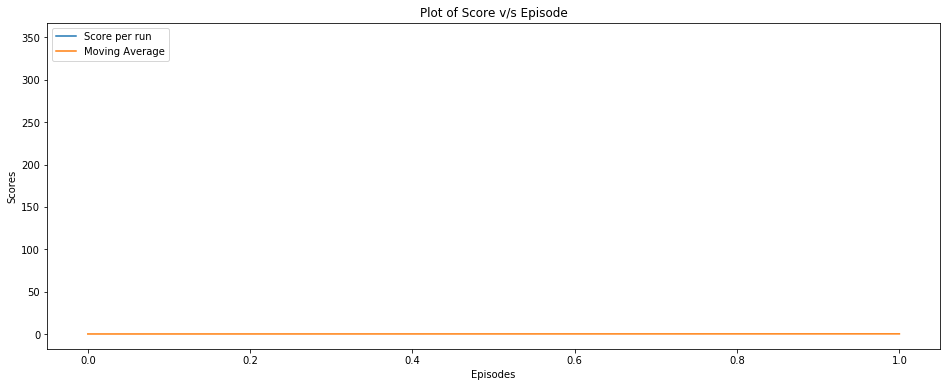

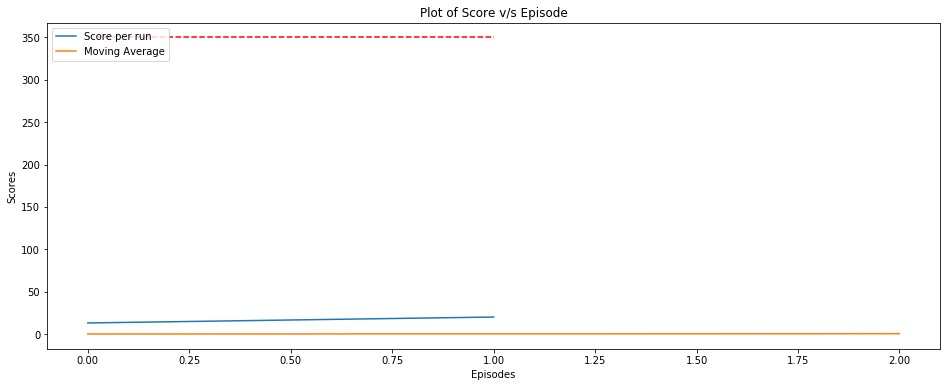

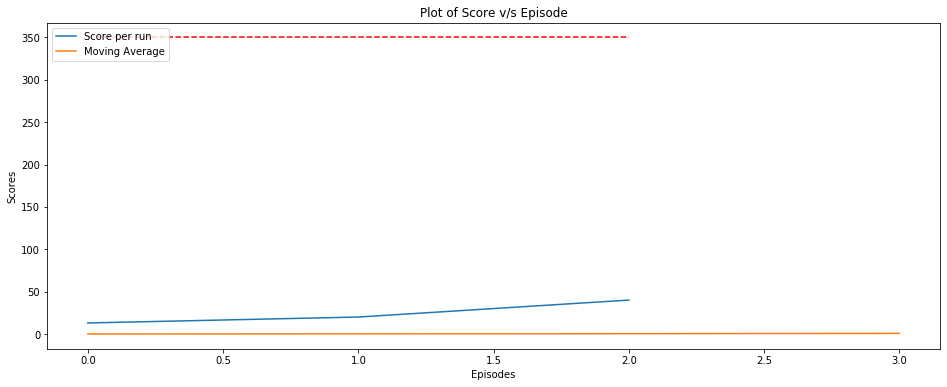

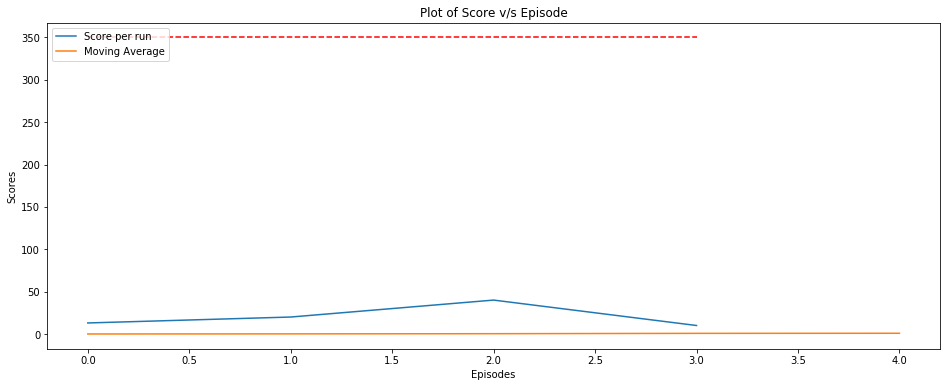

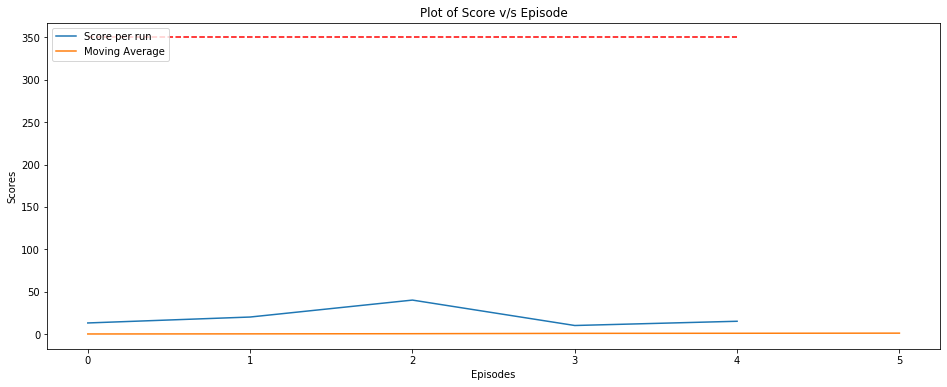

...

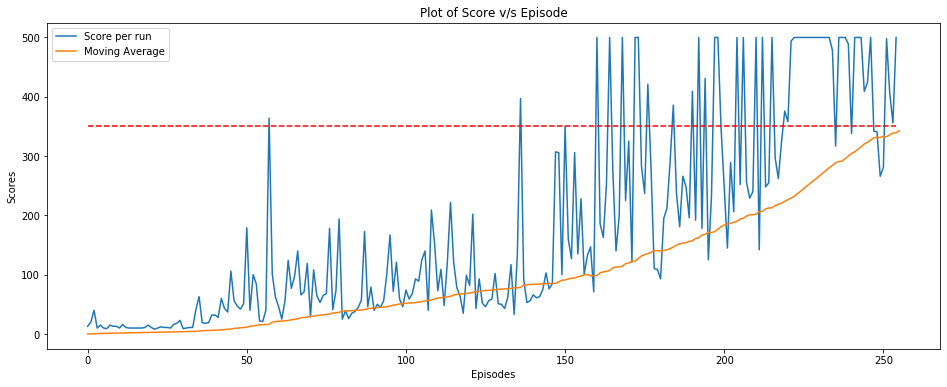

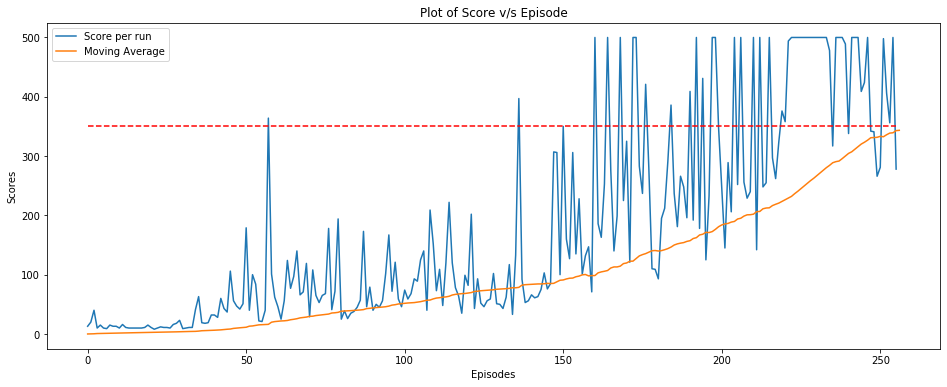

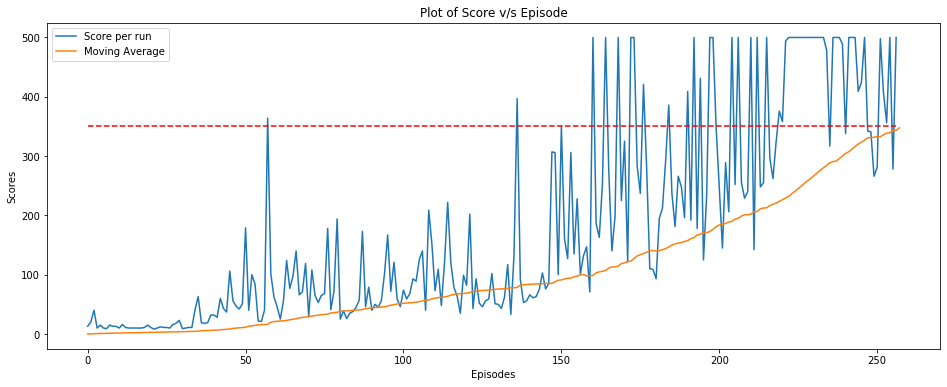

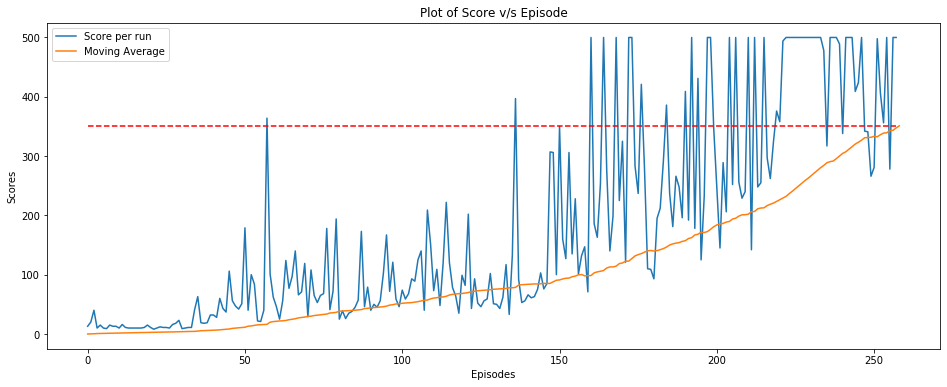

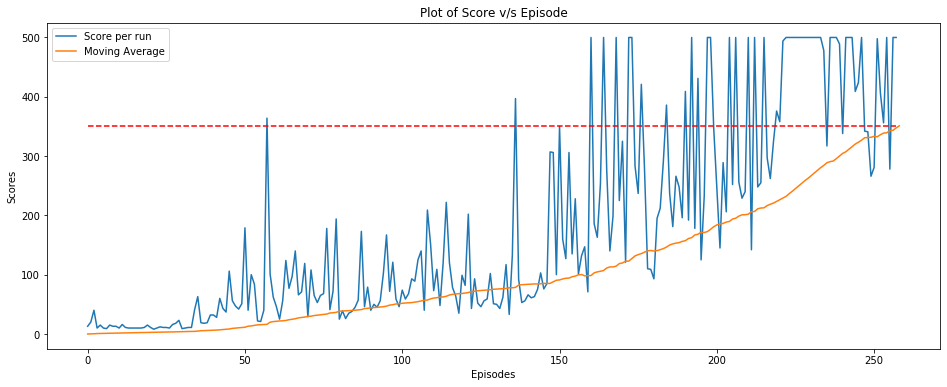

In [14]:
model = train(model_name,target_score=target_score, batch_size=batch_size,
              episodes=episodes, optimizer=optimizer, loss=loss,
              epsilon=epsilon, gamma=gamma, epsilon_min=epsilon_min,
              epsilon_decay=epsilon_decay, actions=actions, render=True)

In [ ]:
plt.figure(figsize=(16, 6))
# Scores
scores_arr = np.array(scores)
plt.plot(scores_arr, label="Score per run")
plt.plot(moving_average(scores_arr,100), label="Moving Average")
# Target
horiz_line_data = np.array([200 for i in range(len(scores))])
plt.plot(horiz_line_data, 'r--') 
# Labels
plt.title('Plot of Score v/s Episode') # title
plt.xlabel('Episodes') # xlabel
plt.ylabel('Scores') # ylabel
plt.legend(loc="upper left")
plt.show()

In [ ]:
deque_lens = [20000,50000,70000]
batch_sizes = [32,128]
epsilon_decays = [0.95,0.995]

scores = []
mean_scores = []

for deque_len_num in deque_lens:
    deque_len = deque_len_num
    for batch_size in batch_sizes:
        for epsilon_decay in epsilon_decays:
            scores = []
            mean_scores = []
            model_name= f'dl-{deque_len}_bs-{batch_size}_ed-{epsilon_decay}'
            model = train(model_name,target_score=target_score, batch_size=batch_size,
              episodes=episodes, optimizer=optimizer, loss=loss,
              epsilon=epsilon, gamma=gamma, epsilon_min=epsilon_min,
              epsilon_decay=epsilon_decay, actions=actions, render=True)


In [ ]:
performance_plot(scores, target_score)

In [ ]:
trained_model.load_weights(filepath=f'{self.models_folder}/{self.model_name}/{self.model_name}.hdf5',by_name=False)